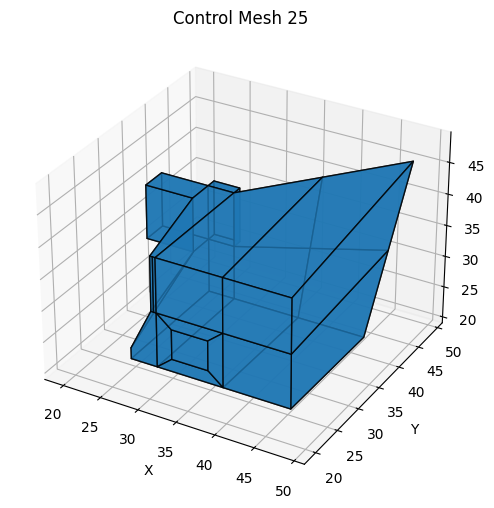

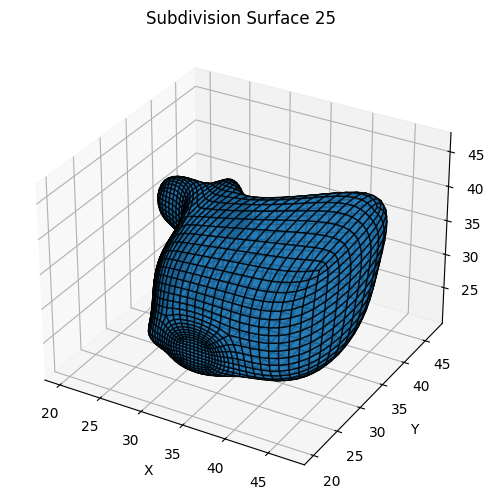

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    """
    Load a PLY mesh (ASCII format) from the dataset.

    Parameters:
    - index (int): Mesh index (0-999)
    - subdiv (bool): If True, loads the subdivided mesh (_subdiv). Otherwise loads control mesh.

    Returns:
    - vertices (np.ndarray): Array of shape (N, 3)
    - faces (list of lists): Each sublist contains indices of one face polygon
    """
    name = f"sample{index:06d}"
    if subdiv:
        name += "_subdiv"
    path = os.path.join(DATA_DIR, f"{name}.ply")
    if not os.path.isfile(path):
        raise FileNotFoundError(f"{path} not found")

    verts = []
    faces = []
    with open(path, 'r') as f:
        # Header
        if f.readline().strip() != 'ply':
            raise ValueError("Not a PLY file")
        fmt = f.readline().strip()
        if not fmt.startswith('format ascii'):
            raise ValueError("Only ASCII PLY supported")

        # Read until end_header, capture counts
        n_verts = n_faces = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'):
                n_verts = int(line.split()[-1])
            elif line.startswith('element face'):
                n_faces = int(line.split()[-1])
            elif line == 'end_header':
                break

        # Vertices
        for _ in range(n_verts):
            x, y, z = map(float, f.readline().split())
            verts.append([x, y, z])

        # Faces
        for _ in range(n_faces):
            vals = list(map(int, f.readline().split()))
            count, idxs = vals[0], vals[1:]
            if len(idxs) != count:
                raise ValueError("Face vertex count mismatch")
            faces.append(idxs)

    return np.array(verts), faces

def visualize_mesh(vertices, faces, ax=None, alpha=0.8, edge_color='k'):
    """
    Visualize a polygonal mesh (supports arbitrary face sizes) in 3D.
    """
    if ax is None:
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')

    polys = [vertices[f] for f in faces]
    mesh = Poly3DCollection(polys, alpha=alpha)
    mesh.set_edgecolor(edge_color)
    ax.add_collection3d(mesh)

    # Auto-scale
    scale = vertices.flatten()
    ax.auto_scale_xyz(scale, scale, scale)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    return ax

# Example usage:
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
v_subd, f_subd = load_ply(idx, subdiv=True)

ax1 = visualize_mesh(v_ctrl, f_ctrl)
ax1.set_title(f"Control Mesh {idx}")

ax2 = visualize_mesh(v_subd, f_subd)
ax2.set_title(f"Subdivision Surface {idx}")

plt.show()


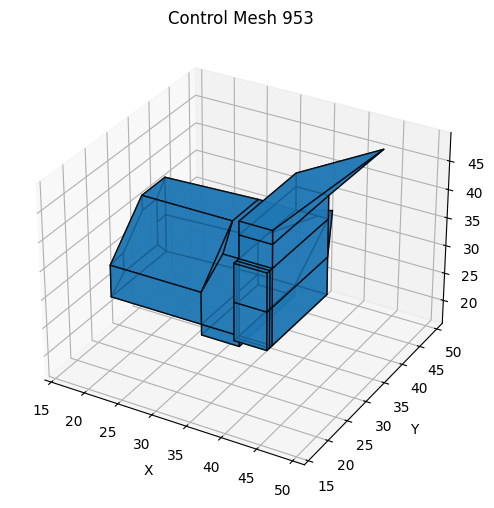

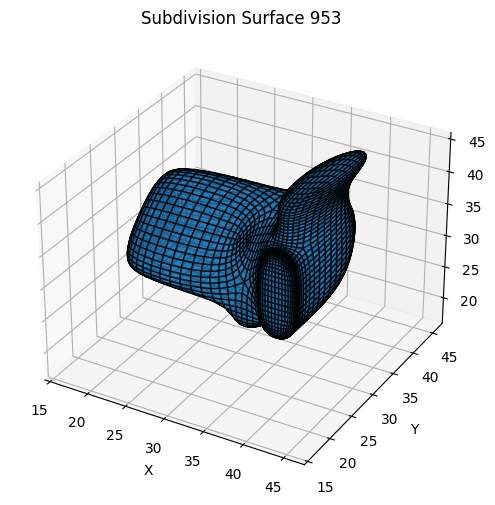

In [2]:
# Example usage:
idx = 953
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
v_subd, f_subd = load_ply(idx, subdiv=True)

ax1 = visualize_mesh(v_ctrl, f_ctrl)
ax1.set_title(f"Control Mesh {idx}")

ax2 = visualize_mesh(v_subd, f_subd)
ax2.set_title(f"Subdivision Surface {idx}")

plt.show()

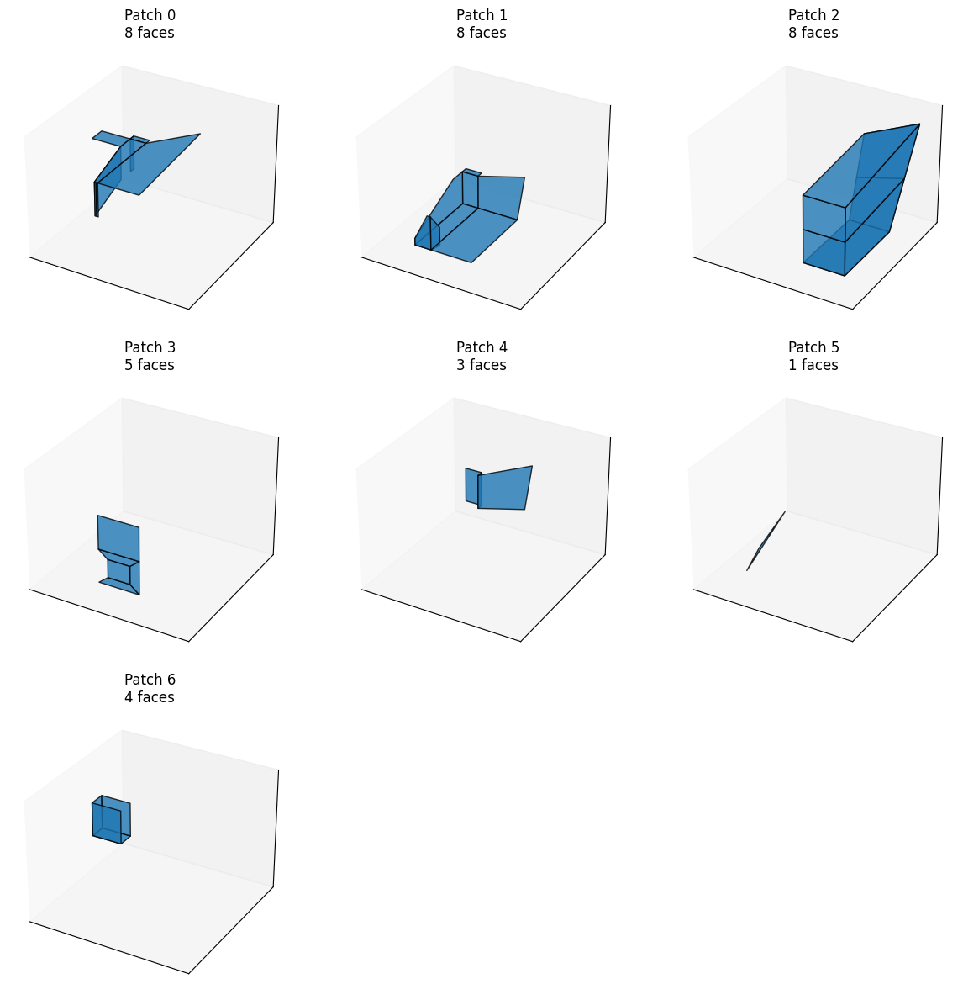

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path,'r') as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'): nv = int(line.split()[-1])
            elif line.startswith('element face'):   nf = int(line.split()[-1])
            elif line=='end_header': break
        for _ in range(nv):
            verts.append(list(map(float,f.readline().split())))
        for _ in range(nf):
            vals = list(map(int,f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

def build_face_adjacency(faces):
    edge2faces = {}
    for fi, f in enumerate(faces):
        for i in range(len(f)):
            e = tuple(sorted((f[i], f[(i+1)%len(f)])))
            edge2faces.setdefault(e, []).append(fi)
    adj = {i:set() for i in range(len(faces))}
    for flist in edge2faces.values():
        if len(flist)>1:
            for a in flist:
                adj[a].update(flist)
    return adj

def segment_into_patches(faces, patch_size=10):
    """
    Greedy region‐growing: pick an unassigned seed face,
    grow by adjacency until `patch_size` faces, repeat.
    Returns list of face‐index lists.
    """
    adj = build_face_adjacency(faces)
    unassigned = set(range(len(faces)))
    patches = []
    while unassigned:
        seed = unassigned.pop()
        patch = {seed}
        frontier = [seed]
        while frontier and len(patch) < patch_size:
            f0 = frontier.pop(0)
            for nb in adj[f0]:
                if nb in unassigned:
                    unassigned.remove(nb)
                    patch.add(nb)
                    frontier.append(nb)
                    if len(patch) >= patch_size:
                        break
        patches.append(list(patch))
    return patches

def visualize_patches(verts, faces, patches, max_patches=9):
    """
    Draw up to `max_patches` colored patches.
    """
    n = min(len(patches), max_patches)
    cols = int(np.ceil(np.sqrt(n)))
    rows = int(np.ceil(n/cols))
    fig = plt.figure(figsize=(4*cols,4*rows))
    for i in range(n):
        ax = fig.add_subplot(rows, cols, i+1, projection='3d')
        for fi in patches[i]:
            poly = verts[faces[fi]]
            ax.add_collection3d(Poly3DCollection([poly], alpha=0.8, edgecolor='k'))
        ax.auto_scale_xyz(verts.flatten(), verts.flatten(), verts.flatten())
        ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
        ax.set_title(f"Patch {i}\n{len(patches[i])} faces")
    plt.tight_layout()
    plt.show()

# --- Example Jupyter cell ---
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)

# break into patches of ~8 faces each
patches = segment_into_patches(f_ctrl, patch_size=8)

# visualize the first 9 patches
visualize_patches(v_ctrl, f_ctrl, patches, max_patches=9)


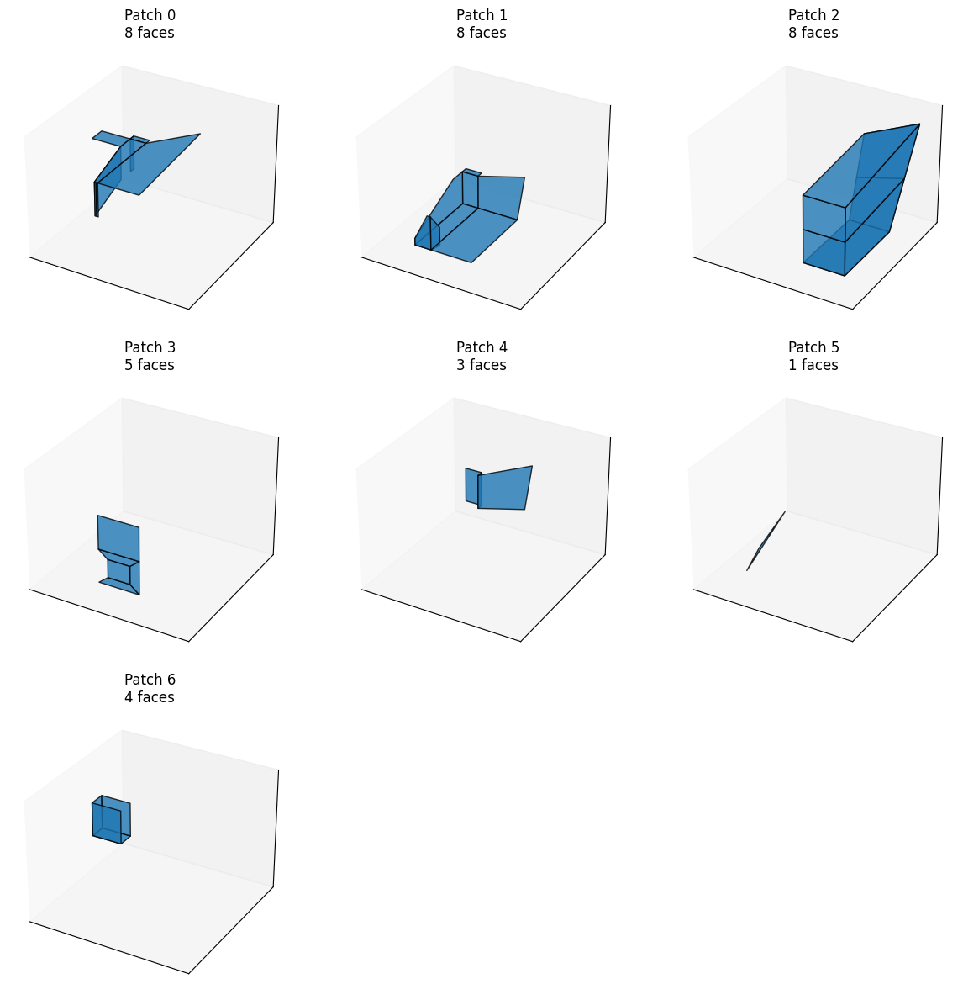

In [4]:
# ─────────────────────────────────────────────────────────────────────────────
# 1) Imports & PLY loader (make sure DATA_DIR is correct)
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path,'r') as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'): nv = int(line.split()[-1])
            elif line.startswith('element face'):   nf = int(line.split()[-1])
            elif line=='end_header': break
        for _ in range(nv):
            verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals = list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# 2) Build face adjacency & segment into small patches
def build_face_adjacency(faces):
    edge2faces = {}
    for fi, f in enumerate(faces):
        for i in range(len(f)):
            e = tuple(sorted((f[i], f[(i+1)%len(f)])))
            edge2faces.setdefault(e, []).append(fi)
    adj = {i:set() for i in range(len(faces))}
    for flist in edge2faces.values():
        if len(flist)>1:
            for a in flist:
                adj[a].update(flist)
    return adj

def segment_into_patches(faces, patch_size=8):
    adj = build_face_adjacency(faces)
    unassigned = set(range(len(faces)))
    patches = []
    while unassigned:
        seed = unassigned.pop()
        patch = {seed}
        frontier = [seed]
        while frontier and len(patch) < patch_size:
            f0 = frontier.pop(0)
            for nb in adj[f0]:
                if nb in unassigned:
                    unassigned.remove(nb)
                    patch.add(nb)
                    frontier.append(nb)
                    if len(patch) >= patch_size:
                        break
        patches.append(list(patch))
    return patches

# 3) Visualization helper
def visualize_patches(verts, faces, patches, max_patches=9):
    n = min(len(patches), max_patches)
    cols = int(np.ceil(np.sqrt(n)))
    rows = int(np.ceil(n/cols))
    fig = plt.figure(figsize=(4*cols,4*rows))
    for i in range(n):
        ax = fig.add_subplot(rows, cols, i+1, projection='3d')
        for fi in patches[i]:
            poly = verts[faces[fi]]
            ax.add_collection3d(Poly3DCollection([poly], alpha=0.8, edgecolor='k'))
        ax.auto_scale_xyz(verts.flatten(), verts.flatten(), verts.flatten())
        ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
        ax.set_title(f"Patch {i}\n{len(patches[i])} faces")
    plt.tight_layout()
    plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 4) Run on sample idx=25:
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
patches = segment_into_patches(f_ctrl, patch_size=8)
visualize_patches(v_ctrl, f_ctrl, patches, max_patches=9)


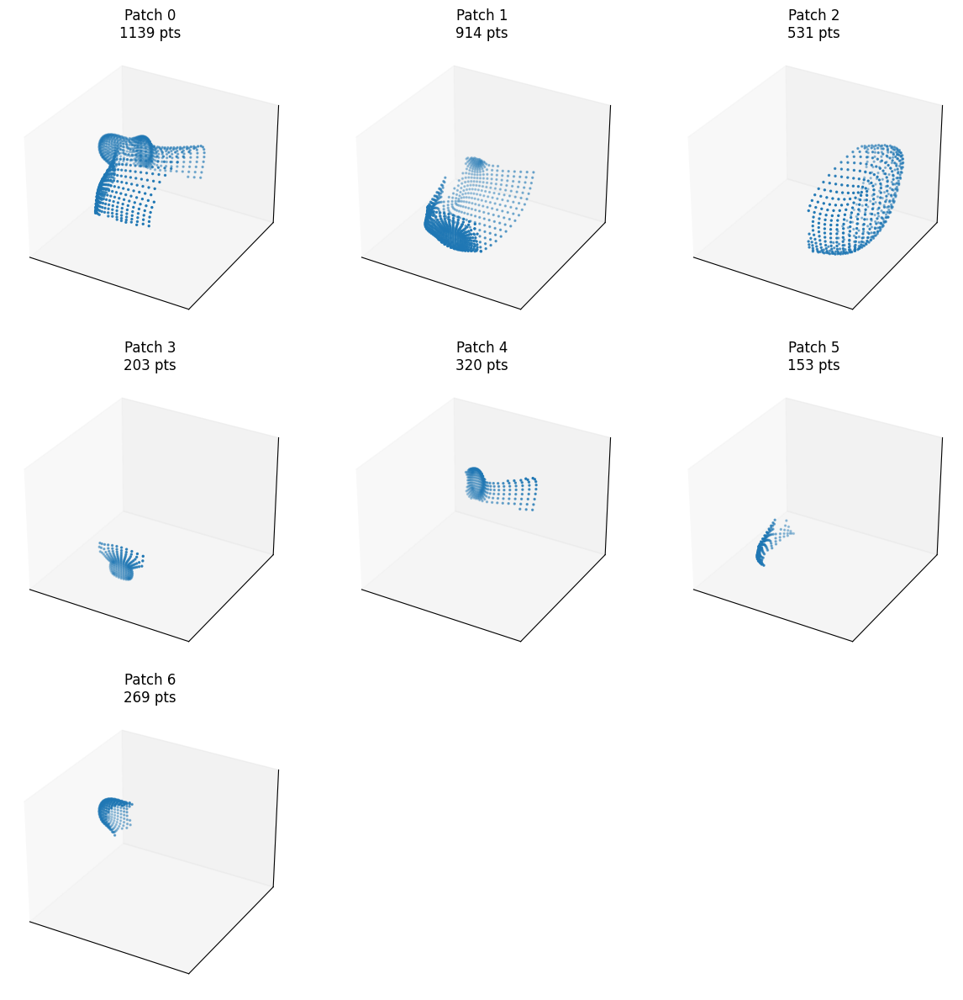

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path, 'r') as f:
        assert f.readline().strip() == 'ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'):
                nv = int(line.split()[-1])
            elif line.startswith('element face'):
                nf = int(line.split()[-1])
            elif line == 'end_header':
                break
        for _ in range(nv):
            verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals = list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

def build_face_adjacency(faces):
    edge2faces = {}
    for fi, f in enumerate(faces):
        for i in range(len(f)):
            e = tuple(sorted((f[i], f[(i+1)%len(f)])))
            edge2faces.setdefault(e, []).append(fi)
    adj = {i:set() for i in range(len(faces))}
    for flist in edge2faces.values():
        if len(flist) > 1:
            for a in flist:
                adj[a].update(flist)
    return adj

def segment_into_patches(faces, patch_size=8):
    adj = build_face_adjacency(faces)
    unassigned = set(range(len(faces)))
    patches = []
    while unassigned:
        seed = unassigned.pop()
        patch = {seed}
        frontier = [seed]
        while frontier and len(patch) < patch_size:
            f0 = frontier.pop(0)
            for nb in adj[f0]:
                if nb in unassigned:
                    unassigned.remove(nb)
                    patch.add(nb)
                    frontier.append(nb)
                    if len(patch) >= patch_size:
                        break
        patches.append(list(patch))
    return patches

# Visualization of subdivided points per patch
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
v_sub, _ = load_ply(idx, subdiv=True)

patches = segment_into_patches(f_ctrl, patch_size=8)
max_patches = 9
n = min(len(patches), max_patches)
cols = int(np.ceil(np.sqrt(n)))
rows = int(np.ceil(n/cols))

fig = plt.figure(figsize=(4*cols, 4*rows))
for i in range(n):
    # compile all control vertices in this patch
    patch_face_idxs = patches[i]
    patch_vert_idxs = set(idx for fidx in patch_face_idxs for idx in f_ctrl[fidx])
    patch_verts = v_ctrl[list(patch_vert_idxs)]
    mn, mx = patch_verts.min(axis=0), patch_verts.max(axis=0)

    # find subdiv points inside the patch's bounding box
    mask = np.all((v_sub >= mn) & (v_sub <= mx), axis=1)
    sub_pts = v_sub[mask]

    ax = fig.add_subplot(rows, cols, i+1, projection='3d')
    ax.scatter(sub_pts[:,0], sub_pts[:,1], sub_pts[:,2], s=2)
    ax.set_title(f"Patch {i}\n{len(sub_pts)} pts")
    ax.auto_scale_xyz(v_sub.flatten(), v_sub.flatten(), v_sub.flatten())
    ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])

plt.tight_layout()
plt.show()


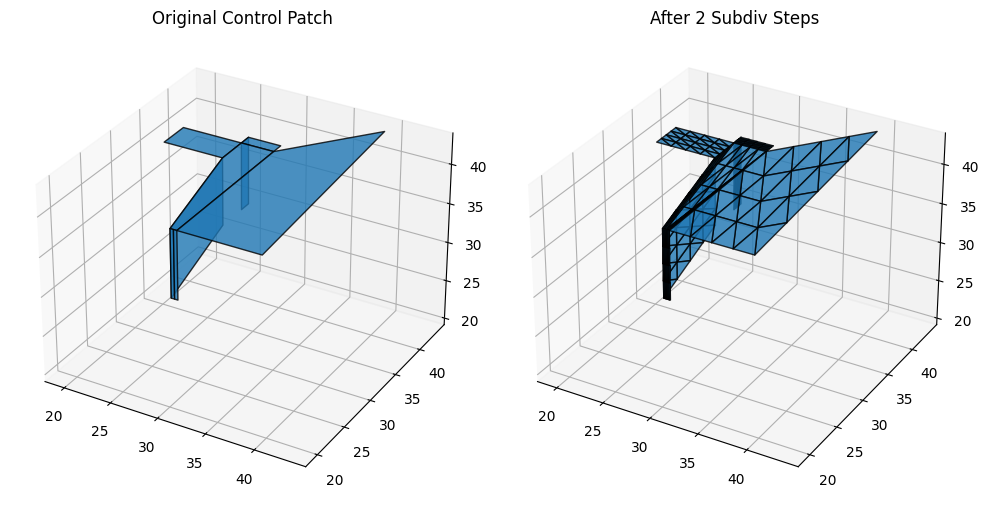

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# ─── 1) PLY loader ──────────────────────────────────────────────────────────
DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path,'r') as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'): nv = int(line.split()[-1])
            elif line.startswith('element face'):   nf = int(line.split()[-1])
            elif line=='end_header': break
        for _ in range(nv):
            verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals = list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# ─── 2) Topology segmentation ────────────────────────────────────────────────
def build_face_adjacency(faces):
    edge2faces = {}
    for fi, f in enumerate(faces):
        for i in range(len(f)):
            e = tuple(sorted((f[i], f[(i+1)%len(f)])))
            edge2faces.setdefault(e, []).append(fi)
    adj = {i:set() for i in range(len(faces))}
    for flist in edge2faces.values():
        if len(flist)>1:
            for a in flist:
                adj[a].update(flist)
    return adj

def segment_into_patches(faces, patch_size=8):
    adj = build_face_adjacency(faces)
    unassigned = set(range(len(faces)))
    patches = []
    while unassigned:
        seed = unassigned.pop()
        patch = {seed}
        frontier = [seed]
        while frontier and len(patch) < patch_size:
            f0 = frontier.pop(0)
            for nb in adj[f0]:
                if nb in unassigned:
                    unassigned.remove(nb)
                    patch.add(nb)
                    frontier.append(nb)
                    if len(patch) >= patch_size:
                        break
        patches.append(list(patch))
    return patches

# ─── 3) Extract control patch ───────────────────────────────────────────────
def extract_control_patch(verts, faces, patch_face_idxs):
    vid_map, new_vs = {}, []
    for fidx in patch_face_idxs:
        for vid in faces[fidx]:
            if vid not in vid_map:
                vid_map[vid] = len(new_vs)
                new_vs.append(verts[vid])
    new_fs = [[vid_map[vid] for vid in faces[fidx]] for fidx in patch_face_idxs]
    return np.array(new_vs), new_fs

# ─── 4) Midpoint subdivision ────────────────────────────────────────────────
def subdivide_midpoint_once(verts, faces):
    tris = []
    for f in faces:
        # triangulate if needed
        for i in range(1, len(f)-1):
            tris.append((f[0], f[i], f[i+1]))
    verts = verts.tolist()
    edge_mid = {}
    new_faces = []
    for (i,j,k) in tris:
        def mid(a,b):
            key = tuple(sorted((a,b)))
            if key not in edge_mid:
                edge_mid[key] = len(verts)
                verts.append(((np.array(verts[a])+np.array(verts[b]))/2).tolist())
            return edge_mid[key]
        m_ij = mid(i,j); m_jk = mid(j,k); m_ki = mid(k,i)
        new_faces += [
            (i, m_ij, m_ki),
            (j, m_jk, m_ij),
            (k, m_ki, m_jk),
            (m_ij, m_jk, m_ki),
        ]
    return np.array(verts), new_faces

def subdivide_midpoint_n_times(verts, faces, n_steps=3):
    V, F = verts, faces
    for _ in range(n_steps):
        V, F = subdivide_midpoint_once(V, F)
    return V, F

# ─── 5) Visualization ───────────────────────────────────────────────────────
def visualize_patch_and_subdiv(verts, faces, n_steps=3):
    V_sub, F_sub = subdivide_midpoint_n_times(verts, faces, n_steps=n_steps)
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.add_collection3d(Poly3DCollection([verts[list(f)] for f in faces],
                                          alpha=0.8, edgecolor='k'))
    ax1.auto_scale_xyz(verts.flatten(), verts.flatten(), verts.flatten())
    ax1.set_title("Original Control Patch")
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.add_collection3d(Poly3DCollection([V_sub[list(f)] for f in F_sub],
                                          alpha=0.8, edgecolor='k'))
    ax2.auto_scale_xyz(V_sub.flatten(), V_sub.flatten(), V_sub.flatten())
    ax2.set_title(f"After {n_steps} Subdiv Steps")
    plt.tight_layout()
    plt.show()

# ─── 6) Run it ───────────────────────────────────────────────────────────────
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
patches = segment_into_patches(f_ctrl, patch_size=8)
patch_idx = 0
v_patch, f_patch = extract_control_patch(v_ctrl, f_ctrl, patches[patch_idx])

n_iterations = 2
visualize_patch_and_subdiv(v_patch, f_patch, n_steps=n_iterations)


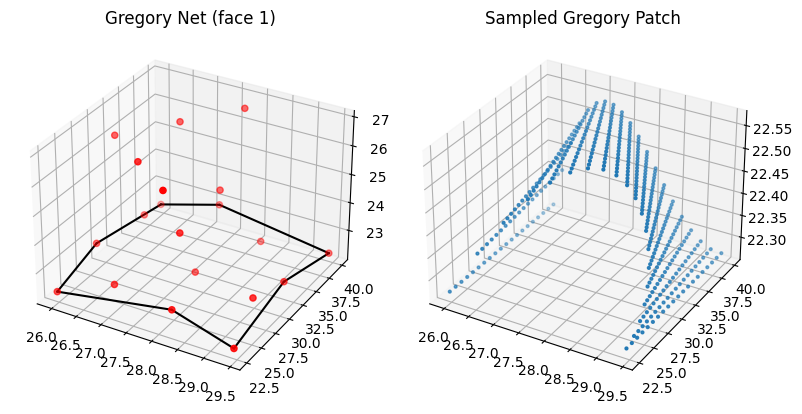

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# ─── 1) PLY loader ──────────────────────────────────────────────────────────
DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path,'r') as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'): nv = int(line.split()[-1])
            elif line.startswith('element face'):   nf = int(line.split()[-1])
            elif line=='end_header': break
        for _ in range(nv):
            verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals = list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# ─── 2) Gregory extraction ─────────────────────────────────────────────────
def face_centroid(verts, face):
    return verts[face].mean(axis=0)

def compute_gregory_control_points(verts, faces, face_idx):
    quad = faces[face_idx]
    assert len(quad)==4, "Face must be a quad"
    V0, V1, V2, V3 = [verts[i] for i in quad]
    # Build edge→face map
    edge2face = {}
    for fi,f in enumerate(faces):
        for i in range(len(f)):
            e = tuple(sorted((f[i],f[(i+1)%len(f)])))
            edge2face.setdefault(e, []).append(fi)
    def adj_cent(vi,vj):
        e = tuple(sorted((vi,vj)))
        fl = [f for f in edge2face[e] if f!=face_idx]
        return face_centroid(verts, faces[fl[0]]) if fl else face_centroid(verts,quad)
    F0 = face_centroid(verts, quad)
    F1 = adj_cent(quad[1],quad[2])
    F2 = adj_cent(quad[2],quad[3])
    F3 = adj_cent(quad[3],quad[0])
    C = np.zeros((20,3))
    # corners
    C[0],C[1],C[2],C[3] = V0,V1,V2,V3
    # edge controls
    C[4]  = (4*V0+2*V1+F0)/7
    C[5]  = (2*V0+4*V1+F1)/7
    C[6]  = (4*V1+2*V2+F1)/7
    C[7]  = (2*V1+4*V2+F2)/7
    C[8]  = (4*V2+2*V3+F2)/7
    C[9]  = (2*V2+4*V3+F3)/7
    C[10] = (4*V3+2*V0+F3)/7
    C[11] = (2*V3+4*V0+F0)/7
    # interior
    C[12]=F0; C[13]=F1; C[14]=F2; C[15]=F3
    C[16]=(F0+F1)/2; C[17]=(F1+F2)/2
    C[18]=(F2+F3)/2; C[19]=(F3+F0)/2
    return C

def sample_gregory_patch(C, u, v):
    # simple Coons‐blend of two opposite edges
    def bez3(P0,P1,P2,P3,t):
        return ((1-t)**3*P0 + 3*(1-t)**2*t*P1 +
                3*(1-t)*t**2*P2 + t**3*P3)
    B0 = bez3(C[0],  C[11], C[10], C[3],  v)
    B1 = bez3(C[1],  C[4],  C[5],  C[2],  v)
    return (1-u)*B0 + u*B1

# ─── 3) Run & visualize ────────────────────────────────────────────────────
# ─── 3) Run & visualize (quad auto-selection) ───────────────────────────────
# (after defining load_ply, compute_gregory_control_points, sample_gregory_patch)

idx = 25
verts_ctrl, faces_ctrl = load_ply(idx, subdiv=False)

# pick the first quad in the mesh
quad_faces = [i for i, f in enumerate(faces_ctrl) if len(f) == 4]
if not quad_faces:
    raise RuntimeError("No quad faces found in this mesh!")
face_idx = quad_faces[0]

# compute the 20 Gregory control points
C = compute_gregory_control_points(verts_ctrl, faces_ctrl, face_idx)

# sample a 20×20 grid over (u,v) ∈ [0,1]²
us = np.linspace(0,1,20)
vs = np.linspace(0,1,20)
pts = np.array([sample_gregory_patch(C, u, v) for u in us for v in vs])

# plot
fig = plt.figure(figsize=(8,4))

ax1 = fig.add_subplot(121, projection='3d')
# draw edges of the Gregory control net
edges = [(0,4),(4,1),(1,6),(6,2),(2,8),(8,3),(3,10),(10,0)]
for i,j in edges:
    ax1.plot(*zip(C[i], C[j]), c='k')
ax1.scatter(C[:,0], C[:,1], C[:,2], c='r', s=20)
ax1.set_title(f"Gregory Net (face {face_idx})")

ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(pts[:,0], pts[:,1], pts[:,2], s=4)
ax2.set_title("Sampled Gregory Patch")

plt.tight_layout()
plt.show()


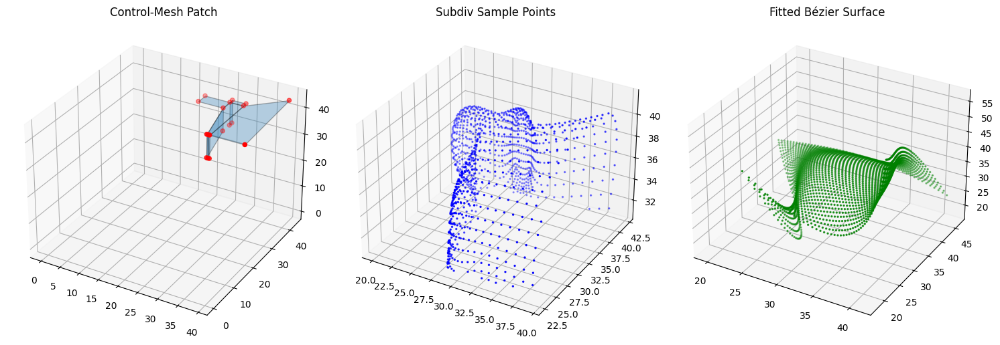

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# --------------------------- 1) Loader ---------------------------------------
DATA_DIR = '/home/ainsworth/master/dataset_1000/'

def load_ply(index, subdiv=False):
    name = f"sample{index:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, f"{name}.ply")
    verts, faces = [], []
    with open(path, 'r') as f:
        assert f.readline().strip() == 'ply'
        assert 'ascii' in f.readline()
        nv = nf = 0
        while True:
            line = f.readline().strip()
            if line.startswith('element vertex'): nv = int(line.split()[-1])
            elif line.startswith('element face'):   nf = int(line.split()[-1])
            elif line == 'end_header': break
        for _ in range(nv):
            verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals = list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# ------------------- 2) Patch extraction by adjacency ------------------------
def build_face_adjacency(faces):
    edge2faces = {}
    for i,f in enumerate(faces):
        for k in range(len(f)):
            e = tuple(sorted((f[k], f[(k+1)%len(f)])))
            edge2faces.setdefault(e, []).append(i)
    adj = {i:set() for i in range(len(faces))}
    for flist in edge2faces.values():
        if len(flist)>1:
            for a in flist:
                adj[a].update(flist)
    return adj

def segment_into_patches(faces, patch_size=8):
    adj = build_face_adjacency(faces)
    unassigned = set(range(len(faces)))
    patches = []
    while unassigned:
        seed = unassigned.pop()
        comp = {seed}
        frontier = [seed]
        while frontier and len(comp)<patch_size:
            u = frontier.pop(0)
            for nb in adj[u]:
                if nb in unassigned:
                    unassigned.remove(nb)
                    comp.add(nb)
                    frontier.append(nb)
                    if len(comp)>=patch_size: break
        patches.append(list(comp))
    return patches

# ------------------- 3) PCA parameterization to (u,v) -----------------------
def parameterize_points(P):
    C = P.mean(axis=0)
    X = P - C
    U,s,Vt = np.linalg.svd(X, full_matrices=False)
    a1, a2 = Vt[0], Vt[1]
    uv = X.dot(np.vstack((a1,a2)).T)
    mn, mx = uv.min(axis=0), uv.max(axis=0)
    uv_norm = (uv - mn)/(mx - mn)
    return uv_norm[:,0], uv_norm[:,1]

# ------------------- 4) Bézier basis & fitting ------------------------------
def bernstein3(t):
    return np.array([(1-t)**3, 3*(1-t)**2*t, 3*(1-t)*t**2, t**3])

def fit_bezier_patch(U, V, P):
    M = len(P)
    A = np.zeros((M, 16))
    for i in range(M):
        Bu = bernstein3(U[i])
        Bv = bernstein3(V[i])
        A[i,:] = np.array([Bu[j]*Bv[k] for j in range(4) for k in range(4)])
    X,_,_,_ = np.linalg.lstsq(A, P, rcond=None)
    return X.reshape((4,4,3))

# ------------------- 5) Evaluate Bézier patch -------------------------------
def eval_bezier_patch(ctrl, res=30):
    us = np.linspace(0,1,res)
    vs = np.linspace(0,1,res)
    pts = []
    for u in us:
        Bu = bernstein3(u)
        for v in vs:
            Bv = bernstein3(v)
            p = np.zeros(3)
            for j in range(4):
                for k in range(4):
                    p += ctrl[j,k] * Bu[j]*Bv[k]
            pts.append(p)
    return np.array(pts)

# ---------------------------- 6) Visualization ------------------------------
def visualize(ctrl_vs, ctrl_fs, P, fit_pts):
    fig = plt.figure(figsize=(15,5))
    ax1 = fig.add_subplot(131, projection='3d')
    for f in ctrl_fs:
        poly = ctrl_vs[list(f)]
        ax1.add_collection3d(Poly3DCollection([poly], alpha=0.3, edgecolor='k'))
    ax1.scatter(ctrl_vs[:,0], ctrl_vs[:,1], ctrl_vs[:,2], c='r')
    ax1.set_title("Control-Mesh Patch")

    ax2 = fig.add_subplot(132, projection='3d')
    ax2.scatter(P[:,0], P[:,1], P[:,2], s=2, c='b')
    ax2.set_title("Subdiv Sample Points")

    ax3 = fig.add_subplot(133, projection='3d')
    ax3.scatter(fit_pts[:,0], fit_pts[:,1], fit_pts[:,2], s=2, c='g')
    ax3.set_title("Fitted Bézier Surface")

    plt.tight_layout()
    plt.show()

# ------------------------------ 7) Execute -----------------------------------
# load meshes
idx = 25
v_ctrl, f_ctrl = load_ply(idx, subdiv=False)
v_sub,  f_sub  = load_ply(idx, subdiv=True)

# extract a patch
patch_faces = segment_into_patches(f_ctrl, patch_size=8)[0]
v_idxs = sorted({vi for fi in patch_faces for vi in f_ctrl[fi]})
v_patch = v_ctrl[v_idxs]
vid_map = {old:i for i,old in enumerate(v_idxs)}
f_patch = [[vid_map[vi] for vi in f_ctrl[fi]] for fi in patch_faces]

# sample subdiv points
mn, mx = v_patch.min(axis=0), v_patch.max(axis=0)
mask = np.all((v_sub >= mn)&(v_sub <= mx), axis=1)
P = v_sub[mask]

# parameterize and fit
U, V = parameterize_points(P)
ctrl_net = fit_bezier_patch(U, V, P)
fit_pts = eval_bezier_patch(ctrl_net, res=50)

# visualize
visualize(v_patch, f_patch, P, fit_pts)


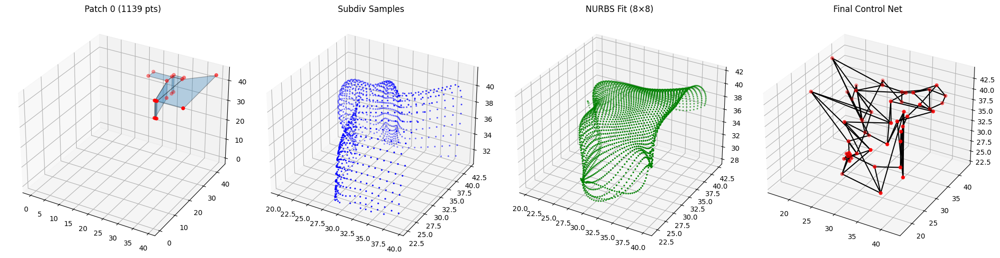

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from geomdl import fitting, NURBS, utilities  # pip install geomdl

# 1) PLY loader
DATA_DIR = '/home/ainsworth/master/dataset_1000/'
def load_ply(idx, subdiv=False):
    name = f"sample{idx:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, name + '.ply')
    verts, faces = [], []
    with open(path) as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv=nf=0
        while True:
            l=f.readline().strip()
            if l.startswith('element vertex'): nv=int(l.split()[-1])
            elif l.startswith('element face'):   nf=int(l.split()[-1])
            elif l=='end_header': break
        for _ in range(nv): verts.append(list(map(float,f.readline().split())))
        for _ in range(nf):
            vals=list(map(int,f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# 2) Build adjacency & segment into patches
def build_adj(faces):
    e2f={}
    for i,f in enumerate(faces):
        for k in range(len(f)):
            e=tuple(sorted((f[k], f[(k+1)%len(f)])))
            e2f.setdefault(e,[]).append(i)
    adj={i:set() for i in range(len(faces))}
    for fl in e2f.values():
        if len(fl)>1:
            for a in fl: adj[a].update(fl)
    return adj

def segment_patches(faces, size=8):
    adj=build_adj(faces)
    un=set(range(len(faces))); patches=[]
    while un:
        seed=un.pop(); comp={seed}; front=[seed]
        while front and len(comp)<size:
            u=front.pop(0)
            for nb in adj[u]:
                if nb in un:
                    un.remove(nb); comp.add(nb); front.append(nb)
                    if len(comp)>=size: break
        patches.append(list(comp))
    return patches

# 3) Threshold‐based control‐point chooser (4…12 poles)
def choose_ctrl_size(n_pts):
    """
    Map the number of samples in a patch (n_pts) to a single
    control‐point count between 4 and 12.

    0–150   → 4
    151–300 → 5
    301–500 → 6
    501–800 → 7
    801–1200→ 8
    1201–2000 → 9
    2001–3000 → 10
    3001–4000 → 11
    >4000   → 12
    """
    if   n_pts <= 150:  return 4
    elif n_pts <= 300:  return 5
    elif n_pts <= 500:  return 6
    elif n_pts <= 800:  return 7
    elif n_pts <= 1200: return 8
    elif n_pts <= 2000: return 9
    elif n_pts <= 3000: return 10
    elif n_pts <= 4000: return 11
    else:               return 12

# 4) get_surface_control_net
def get_surface_control_net(surface_points, degree_u, degree_v,
                             ctrl_u, ctrl_v):
    """
    Fit a ctrl_u×ctrl_v bi-cubic NURBS to the
    nu×nv×3 surface_points grid.
    """
    # downsample grid directly to ctrl‐pole count
    sp = np.transpose(surface_points, (1,0,2))
    nu_act, nv_act, _ = sp.shape
    iu = np.linspace(0, nu_act-1, ctrl_u, dtype=int)
    iv = np.linspace(0, nv_act-1, ctrl_v, dtype=int)
    down = sp[np.ix_(iu, iv)]  # shape (ctrl_u, ctrl_v, 3)
    flat = [down[i,j].tolist()
            for i in range(ctrl_u)
            for j in range(ctrl_v)]
    surf = fitting.approximate_surface(
        flat,
        size_u=ctrl_u, size_v=ctrl_v,
        degree_u=degree_u, degree_v=degree_v
    )
    return surf

# 5) sample_nurbs_surface_with_control_net
def sample_nurbs_surface_with_control_net(surf, nu=50, nv=50):
    u0, u1 = surf.knotvector_u[surf.degree_u], surf.knotvector_u[-(surf.degree_u+1)]
    v0, v1 = surf.knotvector_v[surf.degree_v], surf.knotvector_v[-(surf.degree_v+1)]
    us, vs = np.linspace(u0,u1,nu), np.linspace(v0,v1,nv)
    pts = np.empty((nu,nv,3))
    for i,u in enumerate(us):
        for j,v in enumerate(vs):
            pts[i,j] = np.array(surf.evaluate_single((u,v)))
    try:
        cu, cv = surf.ctrlpts_size
    except TypeError:
        cu, cv = surf.ctrlpts_size_u, surf.ctrlpts_size_v
    ctrl = np.array(surf.ctrlpts).reshape((cu, cv, 3))
    return pts, ctrl

# 6) Main pipeline (patch 0)
idx=25
v_ctrl,f_ctrl=load_ply(idx,False)
v_sub,_=load_ply(idx,True)

# extract patch 0
patch_faces = segment_patches(f_ctrl,8)[0]
v_idxs=sorted({vi for fi in patch_faces for vi in f_ctrl[fi]})
v_patch=v_ctrl[v_idxs]; vid={old:i for i,old in enumerate(v_idxs)}
f_patch=[[vid[vi] for vi in f_ctrl[fi]] for fi in patch_faces]

# collect subdiv pts in patch bbox
mn,mx=v_patch.min(0),v_patch.max(0)
mask=np.all((v_sub>=mn)&(v_sub<=mx),axis=1)
sub_pts=v_sub[mask]; n_pts=len(sub_pts)

# UV via PCA for distribution
C=sub_pts.mean(0); X=sub_pts-C
_,_,Vt=np.linalg.svd(X,full_matrices=False)
uv = X.dot(Vt[:2].T)
uvn = (uv - uv.min(0))/(uv.ptp(0))
U,V=uvn[:,0], uvn[:,1]

# build 12×12 sample grid Q
us,vs=np.linspace(0,1,12),np.linspace(0,1,12)
Q=np.empty((12,12,3))
for i,u in enumerate(us):
    for j,v in enumerate(vs):
        idx_min=np.argmin((U-u)**2 + (V-v)**2)
        Q[i,j]=sub_pts[idx_min]

# determine ctrl size from sample count
ctrl_size = choose_ctrl_size(n_pts)

# fit & sample NURBS
nurbs = get_surface_control_net(Q,
        degree_u=3, degree_v=3,
        ctrl_u=ctrl_size, ctrl_v=ctrl_size)
surf_pts, ctrl_net = sample_nurbs_surface_with_control_net(nurbs,50,50)

# 7) Visualization (4 panels)
fig=plt.figure(figsize=(20,5))

ax1=fig.add_subplot(141,projection='3d')
for f in f_patch:
    poly=v_patch[list(f)]
    ax1.add_collection3d(Poly3DCollection([poly],alpha=0.3,edgecolor='k'))
ax1.scatter(v_patch[:,0],v_patch[:,1],v_patch[:,2],c='r')
ax1.set_title(f"Patch 0 ({n_pts} pts)")

ax2=fig.add_subplot(142,projection='3d')
ax2.scatter(sub_pts[:,0],sub_pts[:,1],sub_pts[:,2],s=2,c='b')
ax2.set_title("Subdiv Samples")

ax3=fig.add_subplot(143,projection='3d')
pts_flat=surf_pts.reshape(-1,3)
ax3.scatter(pts_flat[:,0],pts_flat[:,1],pts_flat[:,2],s=2,c='g')
ax3.set_title(f"NURBS Fit ({ctrl_size}×{ctrl_size})")

ax4=fig.add_subplot(144,projection='3d')
cu,cv,_ = ctrl_net.shape
for i in range(cu):
    ax4.plot(ctrl_net[i,:,0],ctrl_net[i,:,1],ctrl_net[i,:,2],c='k')
for j in range(cv):
    ax4.plot(ctrl_net[:,j,0],ctrl_net[:,j,1],ctrl_net[:,j,2],c='k')
ax4.scatter(ctrl_net[:,:,0],ctrl_net[:,:,1],ctrl_net[:,:,2],c='r')
ax4.set_title("Final Control Net")

plt.tight_layout()
plt.show()



Shape 3 has 7 patches.


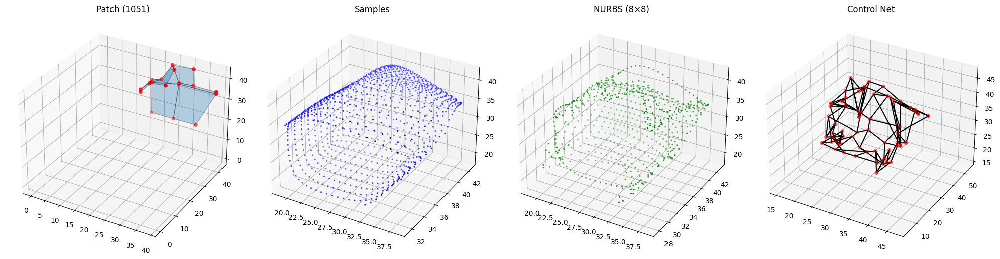

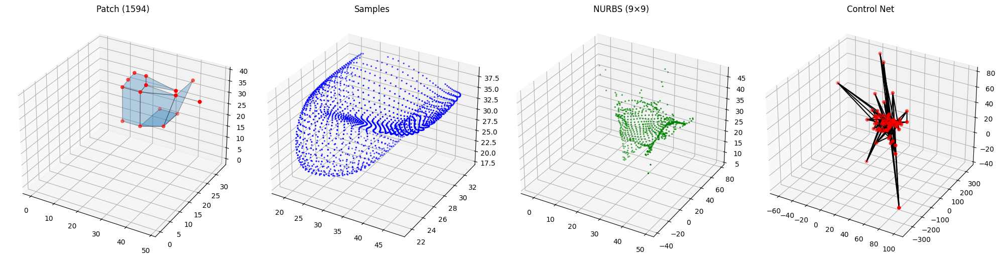

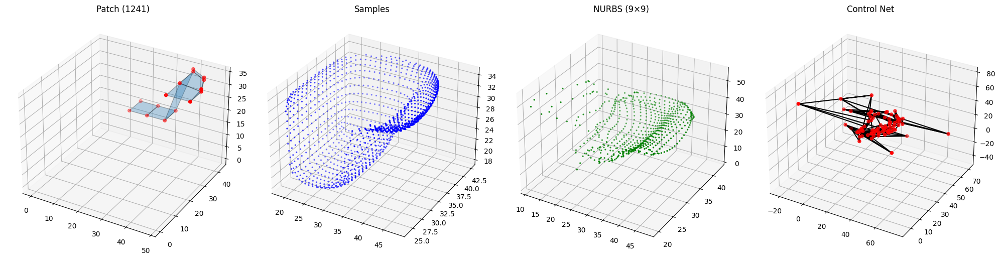

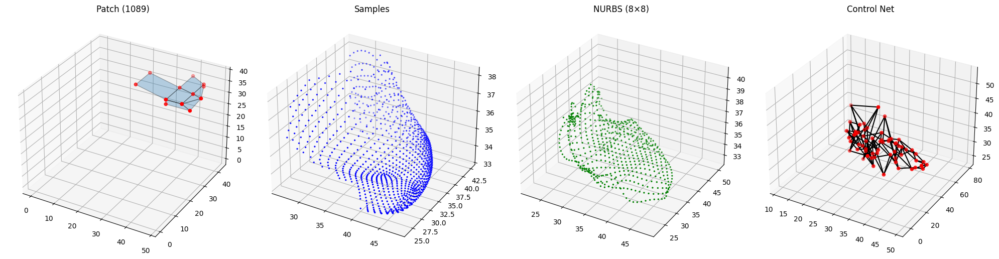

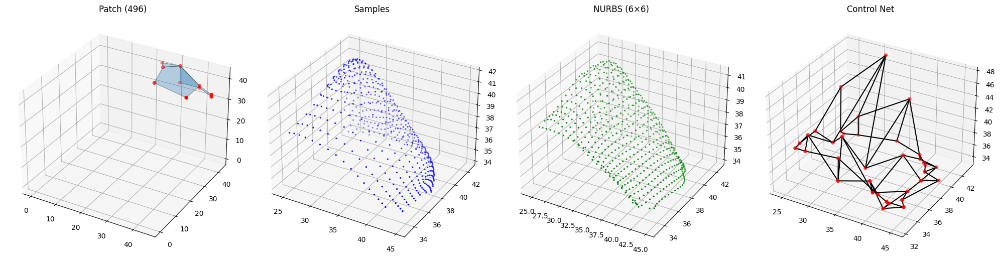

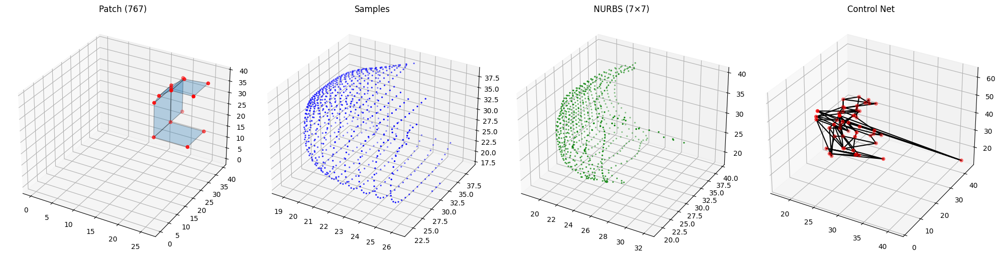

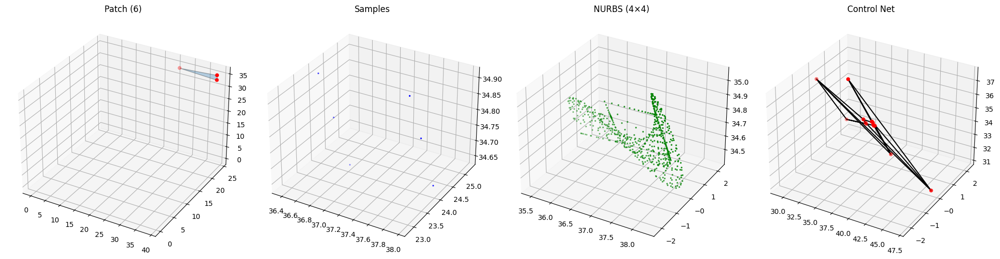

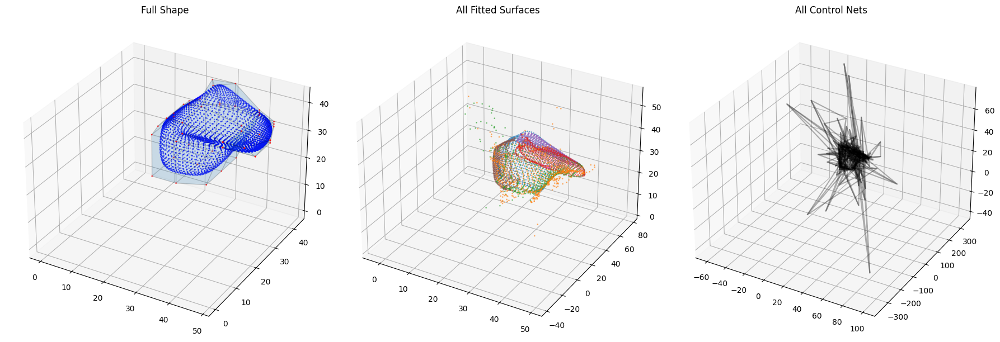

([array([[19.5718    , 32.1723    , 21.7297    ],
         [19.80796148, 32.09459148, 21.6005192 ],
         [19.2547341 , 32.17394225, 22.99555918],
         ...,
         [38.6049318 , 40.93900305, 35.47107759],
         [38.53153476, 40.75197319, 35.70352261],
         [38.1974    , 40.9765    , 35.8082    ]]),
  array([[42.9194    , 25.1188    , 35.0997    ],
         [40.72652942, 21.38850272, 35.14098714],
         [40.24525848, 28.39445667, 35.2939511 ],
         ...,
         [22.75269955, 34.50220428, 18.58737879],
         [22.33299958, 34.22229684, 18.63631473],
         [22.6525    , 33.2202    , 18.5327    ]]),
  array([[20.8744    , 24.0923    , 21.0803    ],
         [24.54936429, 20.76064464, 18.37015312],
         [23.74971414, 22.58934846, 18.8388801 ],
         ...,
         [41.27577604, 40.79563295, 34.06501307],
         [42.21815295, 40.24019574, 34.02994826],
         [43.1474    , 39.6351    , 34.0633    ]]),
  array([[26.4641    , 30.7308    , 38.0106    ],
  

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from geomdl import fitting

# 1) PLY loader
DATA_DIR = '/home/ainsworth/master/dataset_1000/'
def load_ply(idx, subdiv=False):
    name = f"sample{idx:06d}" + ("_subdiv" if subdiv else "")
    path = os.path.join(DATA_DIR, name + '.ply')
    verts, faces = [], []
    with open(path) as f:
        assert f.readline().strip()=='ply'
        assert 'ascii' in f.readline()
        nv=nf=0
        while True:
            l = f.readline().strip()
            if   l.startswith('element vertex'): nv=int(l.split()[-1])
            elif l.startswith('element face'):   nf=int(l.split()[-1])
            elif l=='end_header': break
        for _ in range(nv): verts.append(list(map(float, f.readline().split())))
        for _ in range(nf):
            vals=list(map(int, f.readline().split()))
            faces.append(vals[1:])
    return np.array(verts), faces

# 2) Adjacency & segmentation
def build_adj(faces):
    e2f={}
    for i,f in enumerate(faces):
        for k in range(len(f)):
            e=tuple(sorted((f[k],f[(k+1)%len(f)])))
            e2f.setdefault(e,[]).append(i)
    adj={i:set() for i in range(len(faces))}
    for fl in e2f.values():
        if len(fl)>1:
            for a in fl: adj[a].update(fl)
    return adj

def segment_patches(faces, size=8):
    adj=build_adj(faces)
    un=set(range(len(faces))); patches=[]
    while un:
        seed=un.pop(); comp={seed}; front=[seed]
        while front and len(comp)<size:
            u=front.pop(0)
            for nb in adj[u]:
                if nb in un:
                    un.remove(nb); comp.add(nb); front.append(nb)
                    if len(comp)>=size: break
        patches.append(list(comp))
    return patches

# 3) Control-net size chooser (min = degree+2 = 5)
def choose_ctrl_size(n_pts, degree=3):
    base = degree + 2
    if   n_pts<=150:  return base
    elif n_pts<=300:  return base+1
    elif n_pts<=500:  return base+2
    elif n_pts<=800:  return base+3
    elif n_pts<=1200: return base+4
    else:             return base+5

# 4) NURBS fit
def get_surface_control_net(surface_points, du, dv, cu, cv):
    sp=np.transpose(surface_points,(1,0,2))
    iu=np.linspace(0,sp.shape[0]-1,cu,dtype=int)
    iv=np.linspace(0,sp.shape[1]-1,cv,dtype=int)
    down=sp[np.ix_(iu,iv)]
    flat=[down[i,j].tolist() for i in range(cu) for j in range(cv)]
    return fitting.approximate_surface(
        flat, size_u=cu, size_v=cv,
        degree_u=du, degree_v=dv
    )

# 5) Safe sampler
def sample_nurbs(surf, nu=25, nv=25):
    u0,u1 = surf.knotvector_u[surf.degree_u], surf.knotvector_u[-(surf.degree_u+1)]
    v0,v1 = surf.knotvector_v[surf.degree_v], surf.knotvector_v[-(surf.degree_v+1)]
    us,vs = np.linspace(u0,u1,nu), np.linspace(v0,v1,nv)
    pts=[np.array(surf.evaluate_single((u,v))) for u in us for v in vs]
    size = getattr(surf, "ctrlpts_size", None)
    if isinstance(size, (list,tuple)):
        cu,cv = size
    else:
        cu,cv = surf.ctrlpts_size_u, surf.ctrlpts_size_v
    ctrl = np.array(surf.ctrlpts).reshape((cu,cv,3))
    return np.array(pts), ctrl

# 6) Convert one patch
def convert_patch(v_ctrl,f_ctrl,v_sub, patch_faces, viz=True):
    # extract local control patch
    v_idxs=sorted({vi for fi in patch_faces for vi in f_ctrl[fi]})
    vid={old:i for i,old in enumerate(v_idxs)}
    v_patch=v_ctrl[v_idxs]
    f_patch=[[vid[vi] for vi in f_ctrl[fi]] for fi in patch_faces]

    # mask subdiv points
    mn,mx=v_patch.min(0), v_patch.max(0)
    sub_pts=v_sub[np.all((v_sub>=mn)&(v_sub<=mx),axis=1)]
    n_pts=len(sub_pts)

    # **early exit** if too few samples
    if n_pts < 4:
        print(f"⚠️ Skipping tiny patch (n_pts={n_pts})")
        return None, None

    # PCA→UV
    X=sub_pts - sub_pts.mean(0)
    _,_,Vt=np.linalg.svd(X,full_matrices=False)
    uv=X.dot(Vt[:2].T)
    uv=(uv - uv.min(0)) / uv.ptp(0)
    U,V=uv[:,0],uv[:,1]

    # 12×12 sampling
    us12,vs12=np.linspace(0,1,12),np.linspace(0,1,12)
    Q=np.empty((12,12,3))
    for i,u in enumerate(us12):
        for j,v in enumerate(vs12):
            idx_min=np.argmin((U-u)**2 + (V-v)**2)
            Q[i,j]=sub_pts[idx_min]

    # fit & sample
    cu=choose_ctrl_size(n_pts, degree=3)
    try:
        surf = get_surface_control_net(Q,3,3,cu,cu)
        fit_pts, ctrl_net = sample_nurbs(surf,nu=25,nv=25)
    except Exception as e:
        print(f"⚠️ Patch failed NURBS (n_pts={n_pts}): {e}")
        return None, None

    if viz:
        fig,ax=plt.subplots(1,4,figsize=(20,5),subplot_kw={'projection':'3d'})
        # ctrl patch
        ax[0].add_collection3d(Poly3DCollection([v_patch[f] for f in f_patch],
                                                alpha=0.3,edgecolor='k'))
        ax[0].scatter(*v_patch.T,c='r'); ax[0].set_title(f"Patch ({n_pts})")
        # samples
        ax[1].scatter(sub_pts[:,0],sub_pts[:,1],sub_pts[:,2],s=2,c='b')
        ax[1].set_title("Samples")
        # fit
        ax[2].scatter(fit_pts[:,0],fit_pts[:,1],fit_pts[:,2],s=2,c='g')
        ax[2].set_title(f"NURBS ({ctrl_net.shape[0]}×{ctrl_net.shape[1]})")
        # ctrl net
        cu,cv,_=ctrl_net.shape
        for i in range(cu):
            ax[3].plot(ctrl_net[i,:,0],ctrl_net[i,:,1],ctrl_net[i,:,2],'k-')
        for j in range(cv):
            ax[3].plot(ctrl_net[:,j,0],ctrl_net[:,j,1],ctrl_net[:,j,2],'k-')
        ax[3].scatter(ctrl_net[:,:,0],ctrl_net[:,:,1],ctrl_net[:,:,2],c='r')
        ax[3].set_title("Control Net")
        plt.tight_layout(); plt.show()

    return fit_pts, ctrl_net

# 7) Convert whole shape
def convert_shape(idx, viz_patches=False, viz_shape=False):
    v_ctrl,f_ctrl = load_ply(idx,False)
    v_sub,_       = load_ply(idx,True)
    patches       = segment_patches(f_ctrl,8)
    print(f"Shape {idx} has {len(patches)} patches.")

    all_fits, all_cn = [], []
    for pf in patches:
        pts,cn = convert_patch(v_ctrl,f_ctrl,v_sub,pf,viz_patches)
        if pts is not None:
            all_fits.append(pts)
            all_cn.append(cn)

    if viz_shape:
        fig,axes = plt.subplots(1,3,figsize=(18,6),subplot_kw={'projection':'3d'})
        # full shape
        axes[0].add_collection3d(
            Poly3DCollection([v_ctrl[f] for f in f_ctrl],alpha=0.1,edgecolor='k')
        )
        axes[0].scatter(*v_ctrl.T,c='r',s=1)
        axes[0].scatter(v_sub[:,0],v_sub[:,1],v_sub[:,2],c='b',s=1)
        axes[0].set_title("Full Shape")
        # overlay fits
        for pts in all_fits:
            axes[1].scatter(pts[:,0],pts[:,1],pts[:,2],s=1,alpha=0.5)
        axes[1].set_title("All Fitted Surfaces")
        # overlay control nets
        for cn in all_cn:
            cu,cv,_=cn.shape
            for i in range(cu):
                axes[2].plot(cn[i,:,0],cn[i,:,1],cn[i,:,2],'k-',alpha=0.3)
            for j in range(cv):
                axes[2].plot(cn[:,j,0],cn[:,j,1],cn[:,j,2],'k-',alpha=0.3)
        axes[2].set_title("All Control Nets")
        plt.tight_layout(); plt.show()

    return all_fits, all_cn




import pickle

def convert_all_shapes(
    shape_ids,
    output_dir,
    patch_size=8,
    degree_u=3,
    degree_v=3,
    uv_grid_size=12,
    eval_nu=25,
    eval_nv=25
):
    """
    Batch-convert a list of shapes, saving for each:
      - shape_id
      - configuration_options (all fitting parameters)
      - fitted_surfaces (list of numpy arrays)
      - control_nets (list of numpy arrays)
    """
    # Gather all configuration parameters
    configuration_options = {
        "patch_size": patch_size,
        "degree_u": degree_u,
        "degree_v": degree_v,
        "uv_grid_size": uv_grid_size,
        "eval_nu": eval_nu,
        "eval_nv": eval_nv
    }

    os.makedirs(output_dir, exist_ok=True)

    for idx in shape_ids:
        # Convert the shape without any plotting
        fits, cns = convert_shape(
            idx,
            viz_patches=False,
            viz_shape=False
        )

        # Bundle into a dict
        data = {
            "shape_id": idx,
            "configuration_options": configuration_options,
            "fitted_surfaces": fits,
            "control_nets": cns
        }

        # Save as a pickle
        out_path = os.path.join(output_dir, f"shape_{idx:06d}.pkl")
        with open(out_path, "wb") as f:
            pickle.dump(data, f)

    print(f"Saved {len(shape_ids)} shapes to '{output_dir}'")

# Example usage (commented out):
# all_shape_ids = list(range(1000))
# convert_all_shapes(all_shape_ids, "/home/ainsworth/master/dataset_subdivision")

# 8) Run
convert_shape(3, viz_patches=True, viz_shape=True)


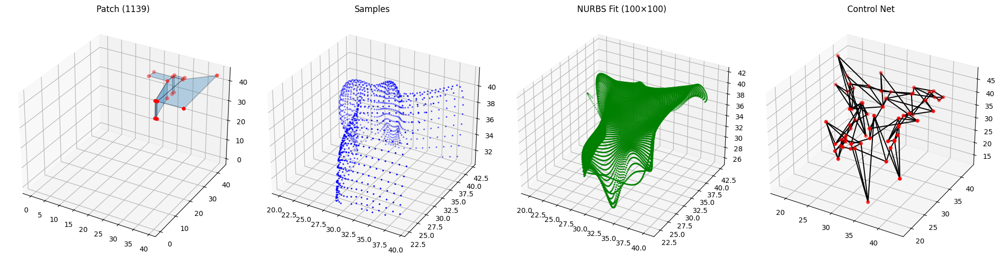

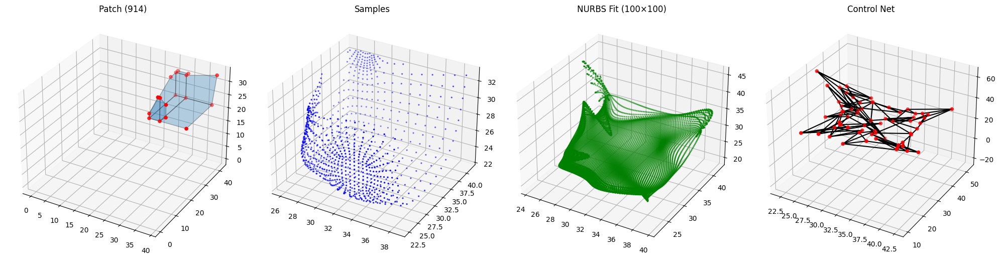

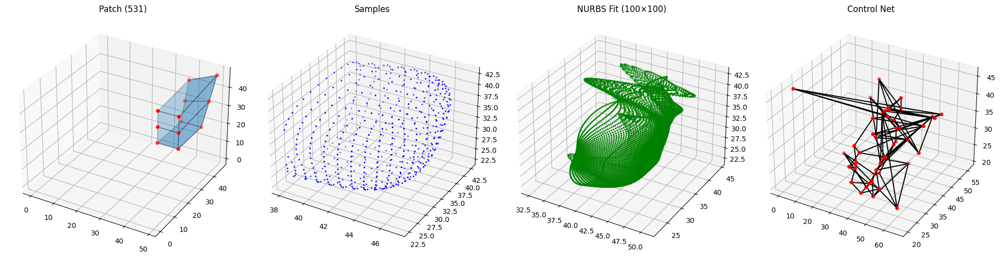

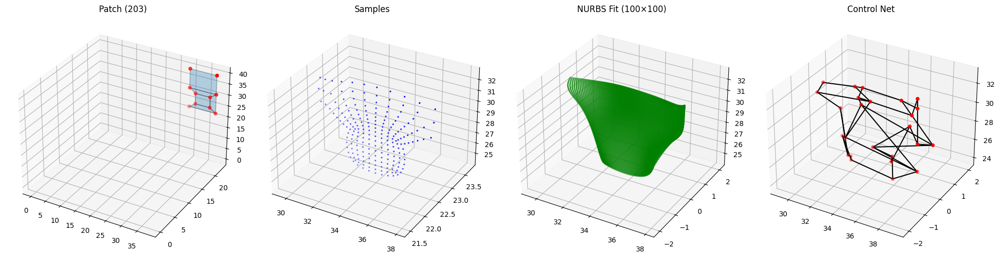

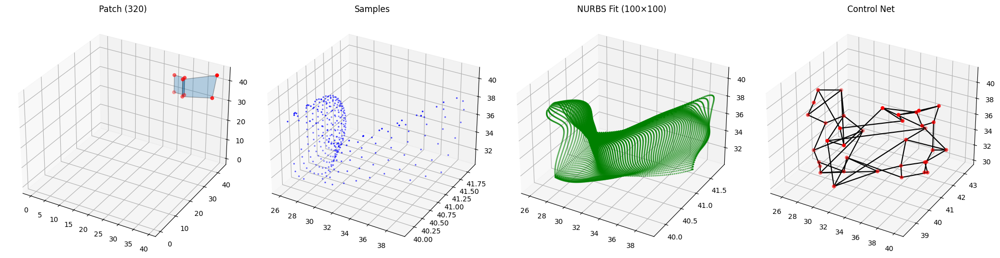

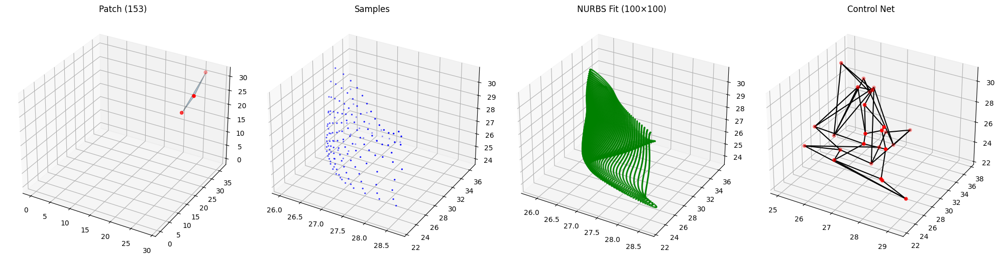

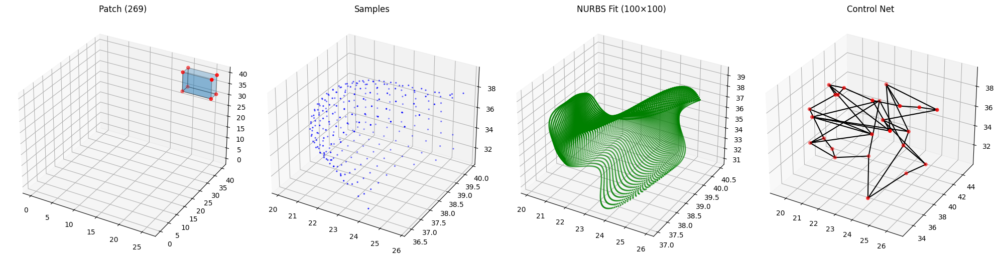

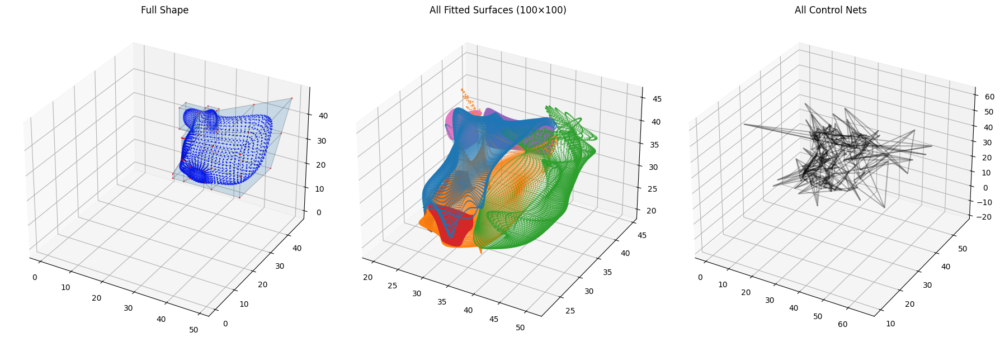

Shape 25: generated 7 fitted 100×100 grids


In [4]:
# If you've saved the library code as subdiv_nurbs.py in your working directory:
from dataset_subdiv import convert_shape

# Pick a shape index to test, e.g. 25
shape_idx = 25

# Run conversion with per-patch and full-shape visualization enabled
fitted_grids, control_nets = convert_shape(shape_idx,
                                           viz_patches=True,
                                           viz_shape=True)

print(f"Shape {shape_idx}: generated {len(fitted_grids)} fitted 100×100 grids")